# Load packages

In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from sklearn.metrics.pairwise import cosine_similarity

# Inital setting for plot size
from matplotlib import rcParams
FIGSIZE=(6, 6)
rcParams['figure.figsize']=FIGSIZE

sc.settings.verbosity = 1
sc.logging.print_header()
# set number of cores to use
sc.settings.n_jobs = 25
sc.settings.set_figure_params( dpi=300, fontsize=6)

# Load python functions

## Color settings

In [6]:
colors_batch = {
    'Aging': '#2277B2',
    'Lister': '#FF7F0E'
}

colors_class = {
    'EN': '#197EC0',
    'IN': '#1A9993',
    'Immune': '#C80813',
    'Mural': '#FD8CC1',
    'Endo': '#FD7446',
    'Astro': '#D2AF81',
    'Oligo': '#D5E4A2',
    'OPC': '#FED439',
    'Others': '#BFBFBF'
}

colors_stage_id = {
    'Fetal': '#F4ECD3', 
    'Neonatal': '#E9D8A6', 
    'Infancy': '#F1D4A4', 
    'Childhood': '#F9CFA1', 
    'Adolescence': '#FFCC66', 
    'Young_Adulthood': '#EE9B00', 
    'Middle_Adulthood': '#CA6702', 
    'Late_Adulthood': '#8C510A'
}

## Whole data analysis without UMAT calculation

In [ ]:
%%sh

python scripts/whole_adata_analysis_beforeUMAT.py \
-i files/freeze3/240201_PsychAD_freeze3_AGING_284_pc_euch.h5ad@${dataPATH}/files/lister_processed.h5ad \
-r 123456 \
-b Aging@Lister \
-o files/freeze3/aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT \
-d 1000 \
-v scanpy@6000 \
-p half \
-n 100 \
-k no

### 6000 hvgs, half pcs, 100 neighbors, rand 123456

#### Load data

In [14]:
adata = sc.read('files/freeze3/aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_adata.h5ad')
adata # 1,452,103 × 14,668

AnnData object with n_obs × n_vars = 1452103 × 14668
    obs: 'Batch', 'SubID', 'Age', 'Sex', 'PMI', 'cell_type_uni', 'subclass_uni', 'subtype_uni', 'dev_mat_uni', 'numerical_age', 'stage_id', 'Channel', 'Source', 'poolID', 'prep', 'rep', 'class', 'subclass', 'subtype', 'RL#', 'age', 'chem', 'concat_id', 'Race', 'Brain Regions*', 'Cause of Death', 'ICD-10 Code', 'ICD-10 category', 'Oxygen/No Oxygen', 'Date-of-Collection', 'Collection_year', 'Library Prep Date', 'Library Prep Lot', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'doublet_score', 'log10_gene_counts', 'log10_UMI_counts', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden', 'mat/dev', 'cell_type', 'major_clust', 'sub_clust'
    var: 'gene_id-Aging', 'gene_name-Aging', 'gene_type-Aging', 'gene_chrom-Aging', 'gene_start-Aging', 'gene_end-Aging', 'n_cells-Aging', 'percent_cells-Aging', 'robust-Aging', 'highly_variable_features-Aging', 'ribosomal-Aging', 'mitochondrial-Aging', 'protein_co

In [5]:
adata.obs['Batch'].value_counts()

Batch
Aging     1304566
Lister     147537
Name: count, dtype: int64

#### UMAP visualization

##### Batch

/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cma

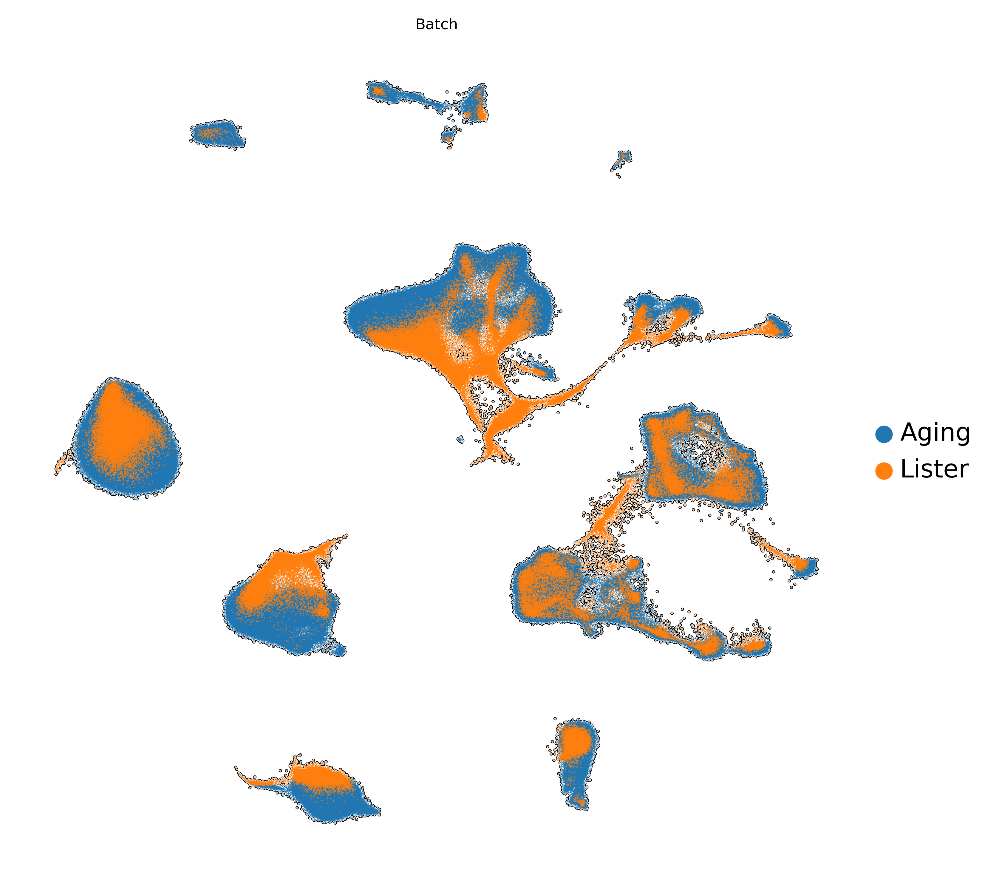

In [19]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.embedding(adata, basis = 'umap', color='Batch', add_outline=True,cmap='vlag',#legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,palette=colors_batch,
               outline_width=(0.5, 0.3), vmin=0, vmax=1,size=1,
               return_fig=True)
plt.savefig('files/freeze3/figures/integrated_data_umap_batch.pdf', transparent=True, format='pdf')

##### cell_type_uni

/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cma

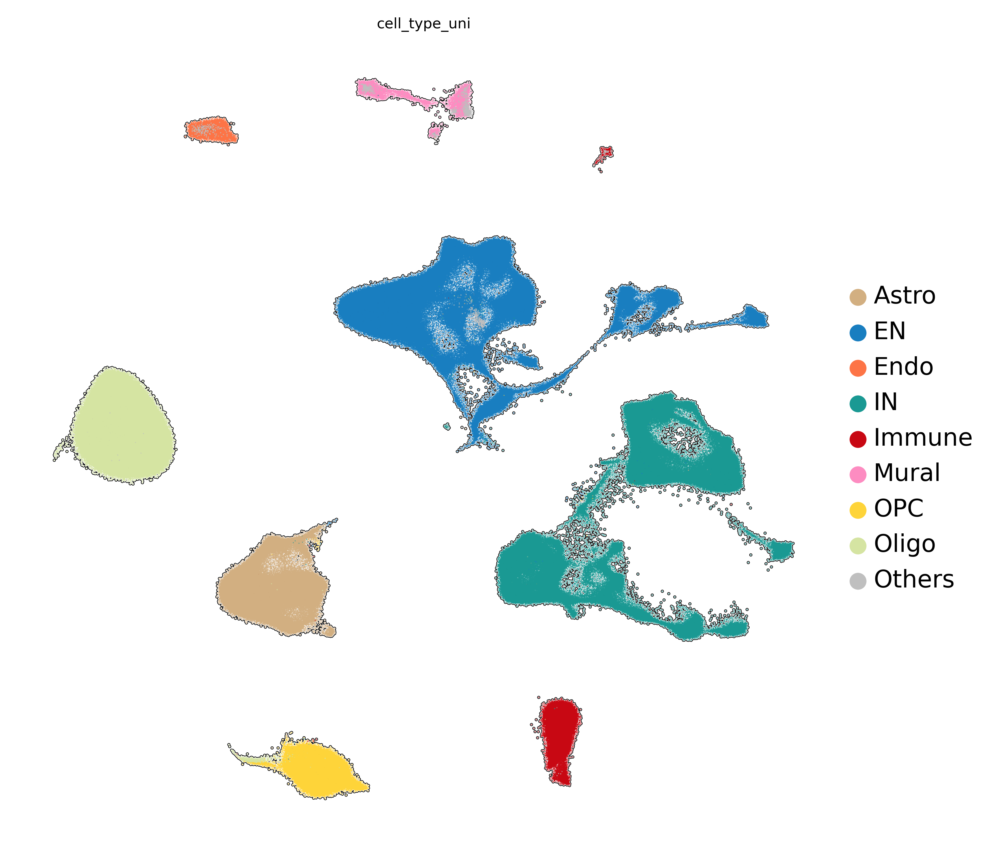

In [18]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.embedding(adata, basis = 'umap', color='cell_type_uni', add_outline=True,cmap='vlag',#legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,palette=colors_class,
               outline_width=(0.5, 0.3), vmin=0, vmax=1,size=1,
               return_fig=True)
plt.savefig('files/freeze3/figures/integrated_data_umap_cell_type_uni.pdf', transparent=True, format='pdf')

##### stage_id

/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cma

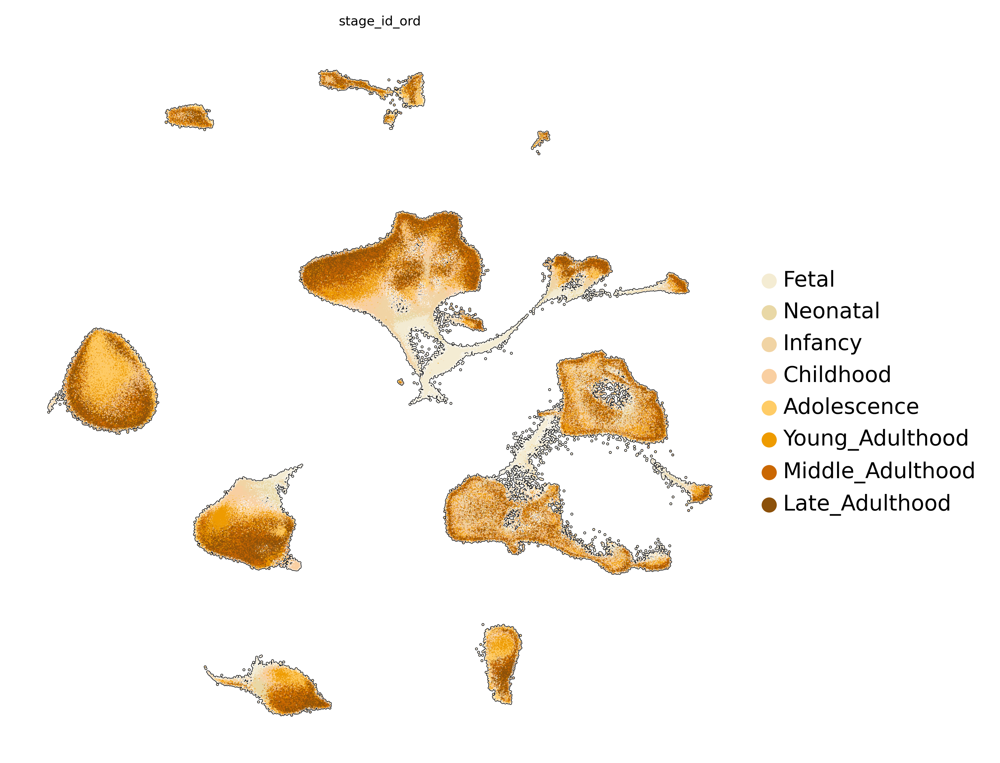

In [17]:
from pandas.api.types import CategoricalDtype
adata.obs['stage_id_ord'] = adata.obs['stage_id']
cat_dtype = CategoricalDtype(categories=adata.uns['stage_order'], ordered=True)
adata.obs['stage_id_ord'] = adata.obs['stage_id_ord'].astype(cat_dtype)

with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.embedding(adata, basis = 'umap', color='stage_id_ord', add_outline=True,cmap='vlag',#legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,palette=colors_stage_id,
               outline_width=(0.5, 0.3), vmin=0, vmax=1,size=1,
               return_fig=True)
plt.savefig('files/freeze3/figures/integrated_data_umap_stage_id_ord.pdf', transparent=True, format='pdf')

#### UMAT calculation

In [ ]:
%%sh

python scripts/UMAT_calculation.py \
-i files/freeze3/aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_adata.h5ad \
-t X_pca \
-p 545 \
-n 100 \
-r 123456 \
-o files/freeze3/aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456

In [20]:
adata = sc.read('files/freeze3/aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_UMAT_adata.h5ad')
adata

AnnData object with n_obs × n_vars = 1452103 × 14668
    obs: 'Batch', 'SubID', 'Age', 'Sex', 'PMI', 'cell_type_uni', 'subclass_uni', 'subtype_uni', 'dev_mat_uni', 'numerical_age', 'stage_id', 'Channel', 'Source', 'poolID', 'prep', 'rep', 'class', 'subclass', 'subtype', 'RL#', 'age', 'chem', 'concat_id', 'Race', 'Brain Regions*', 'Cause of Death', 'ICD-10 Code', 'ICD-10 category', 'Oxygen/No Oxygen', 'Date-of-Collection', 'Collection_year', 'Library Prep Date', 'Library Prep Lot', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'doublet_score', 'log10_gene_counts', 'log10_UMI_counts', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden', 'mat/dev', 'cell_type', 'major_clust', 'sub_clust'
    var: 'gene_id-Aging', 'gene_name-Aging', 'gene_type-Aging', 'gene_chrom-Aging', 'gene_start-Aging', 'gene_end-Aging', 'n_cells-Aging', 'percent_cells-Aging', 'robust-Aging', 'highly_variable_features-Aging', 'ribosomal-Aging', 'mitochondrial-Aging', 'protein_co

In [ ]:
from pandas.api.types import CategoricalDtype
adata.obs['stage_id_ord'] = adata.obs['stage_id']
cat_dtype = CategoricalDtype(categories=adata.uns['stage_order'], ordered=True)
adata.obs['stage_id_ord'] = adata.obs['stage_id_ord'].astype(cat_dtype)
adata

#### UMAT Visualization

##### Batch

/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cma

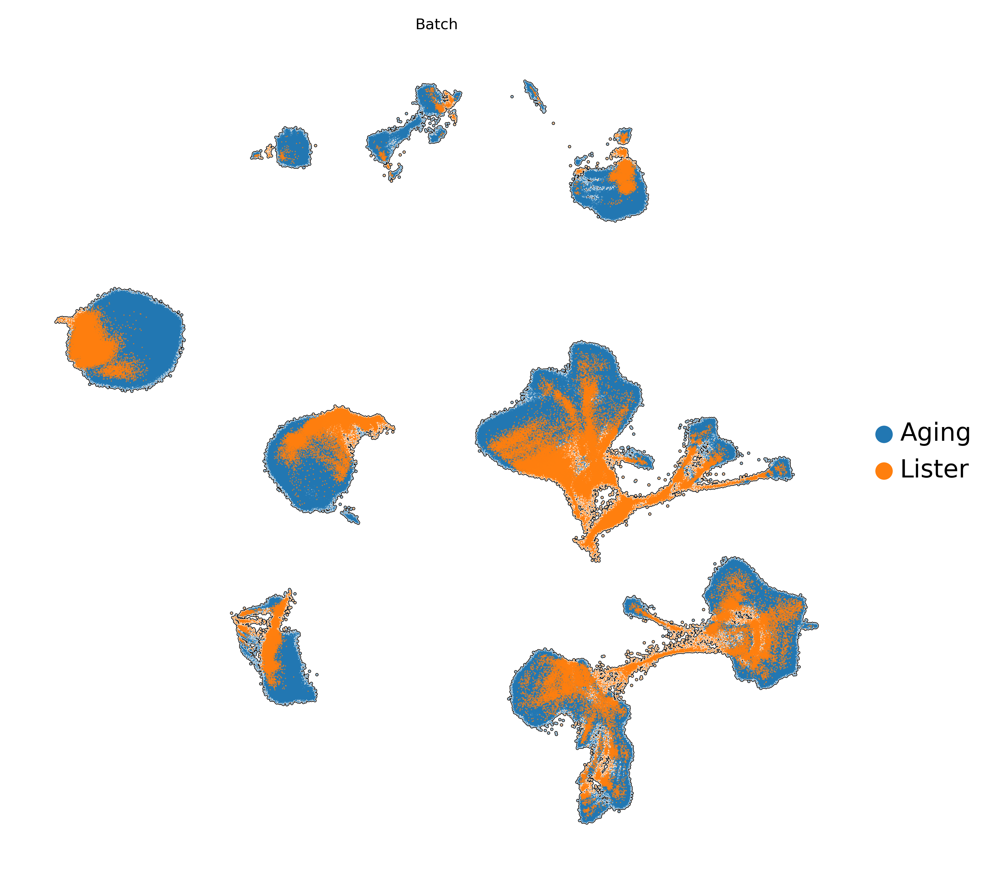

In [22]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.embedding(adata, basis = 'umat', color='Batch', add_outline=True,cmap='vlag',#legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,palette=colors_batch,
               outline_width=(0.5, 0.3), vmin=0, vmax=1,size=1,
               return_fig=True)
plt.savefig('files/freeze3/figures/integrated_data_umat_batch.pdf', transparent=True, format='pdf')

##### cell_type_uni

/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cma

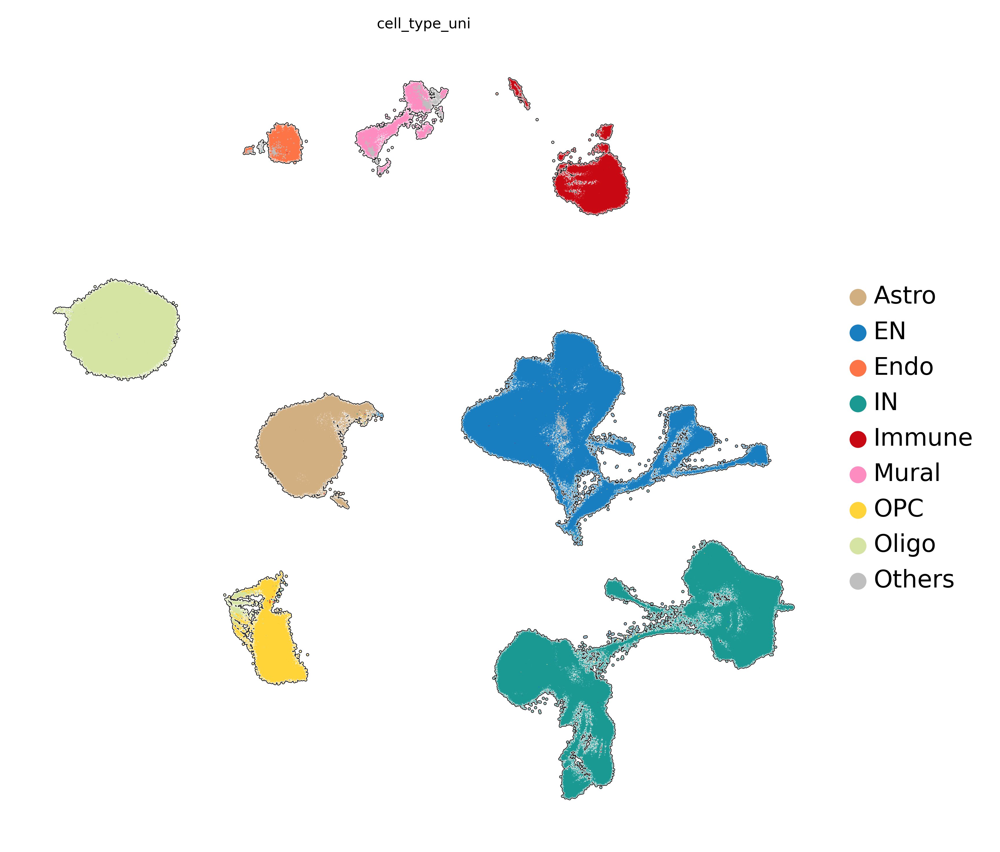

In [23]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.embedding(adata, basis = 'umat', color='cell_type_uni', add_outline=True,cmap='vlag',#legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,palette=colors_class,
               outline_width=(0.5, 0.3), vmin=0, vmax=1,size=1,
               return_fig=True)
plt.savefig('files/freeze3/figures/integrated_data_umat_cell_type_uni.pdf', transparent=True, format='pdf')

##### stage_id

In [ ]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.embedding(adata, basis = 'umat', color='stage_id_ord', add_outline=True,cmap='vlag',#legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,palette=colors_stage_id,
               outline_width=(0.5, 0.3), vmin=0, vmax=1,size=1,
               return_fig=True)
plt.savefig('files/freeze3/figures/integrated_data_umat_stage_id_ord.pdf', transparent=True, format='pdf')

/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cma